In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# !unzip "/content/drive/MyDrive/dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/dog Vision/dog-breed-identification"

In [3]:
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [4]:
labels_csv = pd.read_csv("/content/drive/MyDrive/dog Vision/dog-breed-identification/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

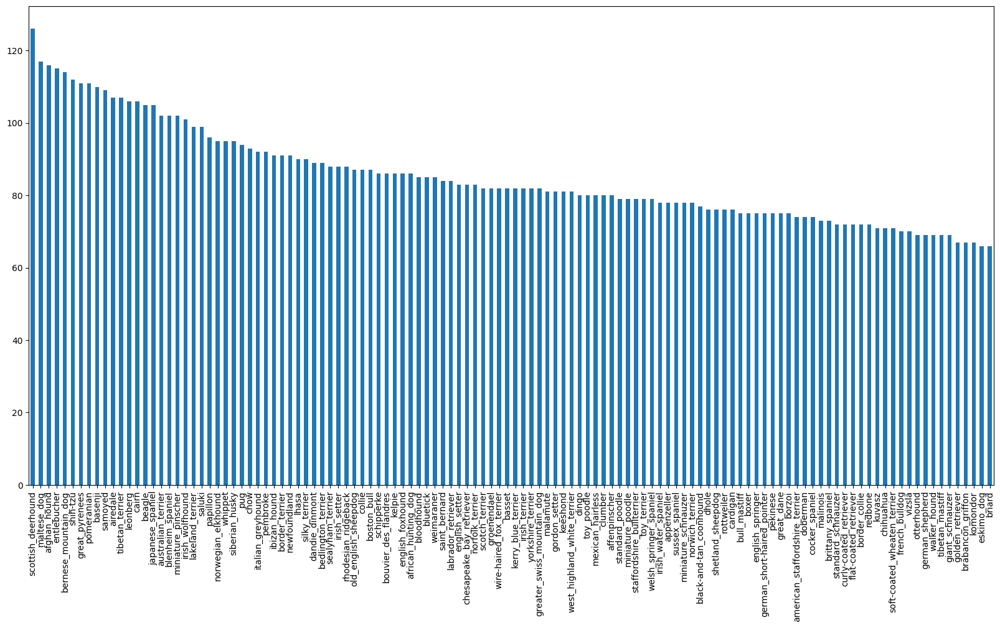

In [5]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10))

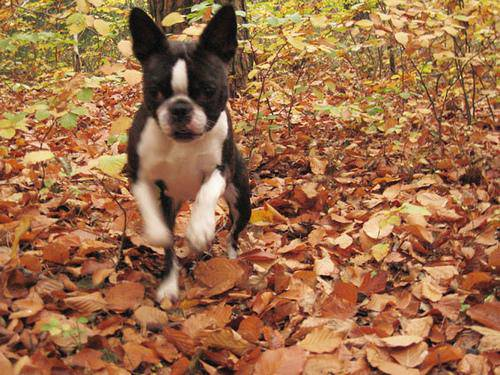

In [6]:
# let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

# Getting images and their labels

In [7]:
filenames = ["/content/drive/MyDrive/dog Vision/dog-breed-identification/train/" + fname+ '.jpg' for fname in labels_csv['id']]

# check the first 10
filenames[:10]

['/content/drive/MyDrive/dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dog Vision/dog-breed-

In [8]:
import os

if(len(os.listdir("/content/drive/MyDrive/dog Vision/dog-breed-identification/train/")) == len(filenames)):
  print("Filenames match actual amount of files!!! proceed.")
else:
  print('Filesnames do no match actual amount of files, check the target directory')


Filenames match actual amount of files!!! proceed.


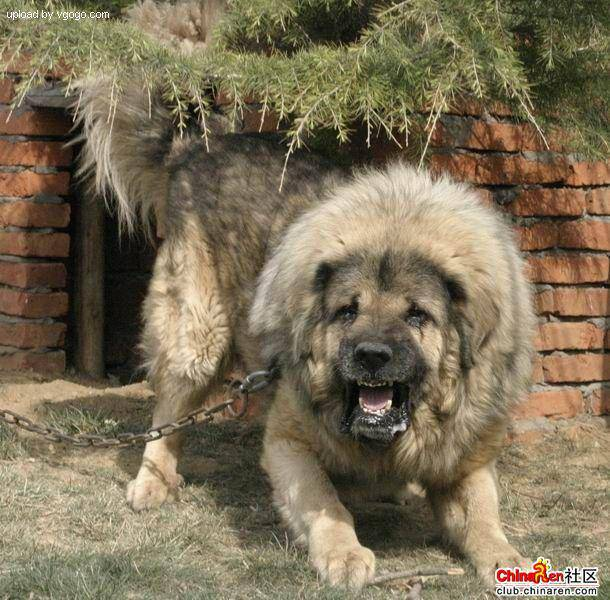

In [9]:
Image(filenames[9000])

In [10]:
labels = labels_csv['breed']
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [11]:
len(labels) == len(filenames)

True

In [12]:
unique_breeds = np.unique(labels)
len(unique_breeds)

"boston_bull" == unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [13]:
# turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [14]:
len(boolean_labels)

10222

# experiment with 1000 images

In [15]:
# setup X, y varaibles
X = filenames
y = boolean_labels

NUM_IMAGES = 1000

In [16]:
# split our data
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

# preprocessing image turning them into tensors

In [17]:
IMG_SIZE =224

def process_image(image_path):
  """
  Take an image file path and turns the image into a tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the  jpeg image into tensor
  image = tf.io.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize the image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  
  return image

In [18]:
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [19]:
BATCH_SIZE =32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data =False):
  """
  Creates batches of data out of image (X) and label y pairs.
  shuffles the data if it's training data but doesn't shuffle if it's validation data
  Also accepts test data as input (no labels)
  """
  # if the data is test dataset
  if test_data:
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if data is valid dataset, we don't need to shuffle it
  elif valid_data:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), 
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    #shuffle
    data = data.shuffle(buffer_size=len(X))

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

    return data_batch

In [20]:
# Creating training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

In [21]:
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  plt.figure(figsize=(10, 10))
  for i in range(25):
    ax = plt.subplot(5,5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis(False)
    

In [22]:
train_images, train_labels = next(train_data.as_numpy_iterator())

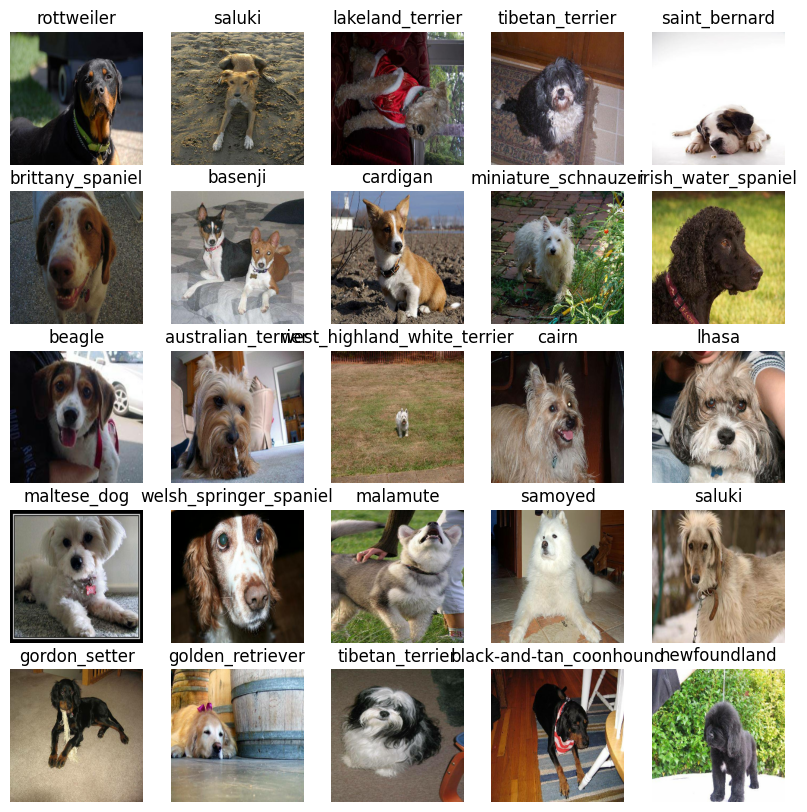

In [23]:
show_25_images(train_images, train_labels)

In [24]:
INPUT_SHAPE=[None, IMG_SIZE, IMG_SIZE, 3]

OUTPUT_SHAPE = 120

# Model for our transfer learning model
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [25]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  model = tf.keras.Sequential([
      hub.KerasLayer(model_url),
      tf.keras.layers.Dense(output_shape, activation='softmax')
  ])

  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy'])
  
  model.build(input_shape)

  return model

In [26]:
model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [27]:
%load_ext tensorboard

In [28]:
import datetime

# create a function to build a Tensorboard callback
def create_tensorboard_callback():
  logdir = os.path.join("drive/My Drive/dog Vision/logs",
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

In [29]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)

In [30]:
NUM_EPOCHS = 100

In [31]:
def train_model():

  model = create_model()

  tensorboard_callback= create_tensorboard_callback()

  model.fit(train_data, 
                    epochs=NUM_EPOCHS,
                    steps_per_epoch=len(train_data),
                    validation_data=val_data, 
                    validation_steps=len(val_data),
                    callbacks=[tensorboard_callback, early_stopping])
  
  return model

In [32]:
model = train_model()

Epoch 1/100
25/25 [==============================] - 170s 6s/step - loss: 4.4443 - accuracy: 0.0950 - val_loss: 3.3295 - val_accuracy: 0.3100
Epoch 2/100
25/25 [==============================] - 4s 145ms/step - loss: 1.5541 - accuracy: 0.7150 - val_loss: 2.1289 - val_accuracy: 0.5200
Epoch 3/100
25/25 [==============================] - 5s 187ms/step - loss: 0.5498 - accuracy: 0.9337 - val_loss: 1.6722 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - 5s 188ms/step - loss: 0.2489 - accuracy: 0.9837 - val_loss: 1.4915 - val_accuracy: 0.6650
Epoch 5/100
25/25 [==============================] - 6s 241ms/step - loss: 0.1459 - accuracy: 0.9962 - val_loss: 1.4389 - val_accuracy: 0.6650
Epoch 6/100
25/25 [==============================] - 3s 139ms/step - loss: 0.0999 - accuracy: 1.0000 - val_loss: 1.3838 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================] - 6s 233ms/step - loss: 0.0752 - accuracy: 1.0000 - val_loss: 1.3499 - val_accuracy: 0.6800


In [33]:
%tensorboard --logdir drive/My\ Drive/dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [34]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 133ms/step


array([[7.08102423e-04, 6.28444541e-05, 4.09606437e-04, ...,
        2.45393952e-04, 1.76993090e-05, 1.07804500e-02],
       [1.28050963e-03, 6.17838698e-04, 9.42944549e-03, ...,
        2.72186677e-04, 9.74957831e-04, 4.41331140e-05],
       [3.56059500e-05, 1.90812789e-05, 1.76297312e-04, ...,
        8.52769372e-05, 1.38943185e-04, 6.78169599e-05],
       ...,
       [1.39060612e-05, 1.13880873e-04, 9.05679481e-05, ...,
        9.75910152e-05, 2.24175761e-04, 4.31005261e-04],
       [6.02268707e-03, 1.97687914e-04, 1.17212694e-04, ...,
        5.97084472e-05, 2.42230417e-05, 1.80670153e-02],
       [3.21772823e-04, 2.67569885e-05, 8.85827685e-05, ...,
        9.71963571e-04, 1.82071980e-03, 1.56426486e-05]], dtype=float32)

In [35]:
unique_breeds[predictions[0].argmax()]

'irish_wolfhound'

In [36]:
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [37]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

In [38]:
val_images, val_labels = unbatchify(val_data)

In [39]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)

  if pred_label == true_label:
    color = "green"
  else:
      color= "red"

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  plt.axis(False)

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob) *100,
                                    true_label),
            color=color)

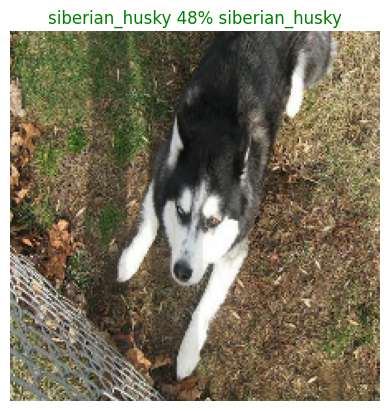

In [40]:
plot_pred(predictions,
          val_labels,
          val_images,
          n=35
          )

In [41]:
def plot_pred_conf(prediction_probabilities, labels, n =1):
  """
  Plus the top highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  pred_label = get_pred_label(pred_prob)

  # Find the top 10 predictions
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # find top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]


  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels,
             rotation="vertical")
  
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

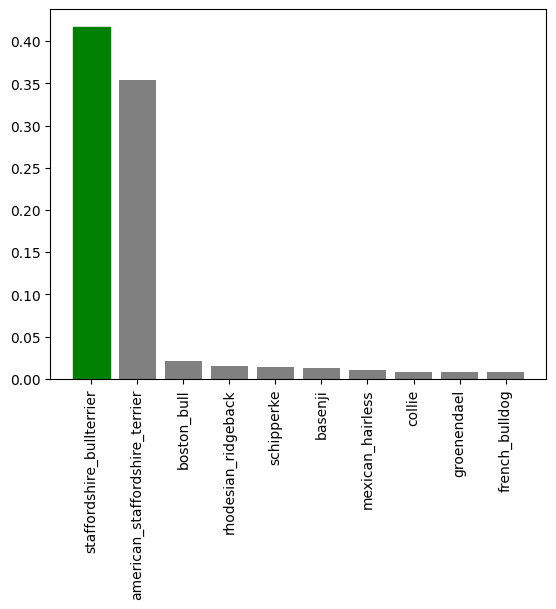

In [42]:
plot_pred_conf(predictions, val_labels, 50)

# Training the big model

In [43]:
full_data = create_data_batches(X, y)

In [45]:
full_model = create_model()

full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                                     patience=3)

In [46]:
full_model.fit(x=full_data, epochs=100, callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 41s 109ms/step - loss: 1.3402 - accuracy: 0.6734
Epoch 2/100
320/320 [==============================] - 38s 117ms/step - loss: 0.4001 - accuracy: 0.8829
Epoch 3/100
320/320 [==============================] - 34s 105ms/step - loss: 0.2326 - accuracy: 0.9360
Epoch 4/100
320/320 [==============================] - 34s 106ms/step - loss: 0.1517 - accuracy: 0.9661
Epoch 5/100
320/320 [==============================] - 34s 105ms/step - loss: 0.1050 - accuracy: 0.9782
Epoch 6/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0784 - accuracy: 0.9859
Epoch 7/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0593 - accuracy: 0.9911
Epoch 8/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0453 - accuracy: 0.9948
Epoch 9/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0367 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 33s 103m

## Make prediction for test

In [48]:
test_path = "/content/drive/MyDrive/dog Vision/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/dog Vision/dog-breed-identification/test/ef0ec3c95160918de7bd290897ea9f65.jpg',
 '/content/drive/MyDrive/dog Vision/dog-breed-identification/test/ea8669c09612478bfa202ae2fa101b13.jpg',
 '/content/drive/MyDrive/dog Vision/dog-breed-identification/test/f407f19970c6d8d516722e899adc599c.jpg',
 '/content/drive/MyDrive/dog Vision/dog-breed-identification/test/f13011a399f175d88c17d2bd1785625e.jpg',
 '/content/drive/MyDrive/dog Vision/dog-breed-identification/test/ed574861296d0946948a4225e60e8d75.jpg',
 '/content/drive/MyDrive/dog Vision/dog-breed-identification/test/ec0a814cc971dbe6e618a9a37ba355f8.jpg',
 '/content/drive/MyDrive/dog Vision/dog-breed-identification/test/f04afba75c6b505c74c9958aa8aabffa.jpg',
 '/content/drive/MyDrive/dog Vision/dog-breed-identification/test/ea02c2e76cd1c51e5a07280ca363dbc5.jpg',
 '/content/drive/MyDrive/dog Vision/dog-breed-identification/test/f0f205d037fe626670165aca00fc8b81.jpg',
 '/content/drive/MyDrive/dog Vision/dog-breed-identific

In [49]:
len(test_filenames)

10357

In [50]:
test_data = create_data_batches(test_filenames, test_data=True)

In [51]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [52]:
test_predictions = full_model.predict(test_data, 
                                             verbose=1)

324/324 [==============================] - 2323s 7s/step


In [54]:
test_predictions

array([[2.1065359e-08, 9.0541660e-05, 8.9923695e-09, ..., 6.9894348e-03,
        1.1643718e-06, 9.8989730e-08],
       [4.7239207e-10, 8.4028923e-11, 1.6339957e-13, ..., 2.8536255e-13,
        3.4033708e-13, 2.5531148e-12],
       [3.2634681e-10, 2.3572843e-12, 8.2114607e-11, ..., 8.7716776e-09,
        1.7754170e-10, 2.3333266e-11],
       ...,
       [4.4797978e-04, 5.0295643e-05, 1.5631294e-08, ..., 5.1540246e-07,
        3.7061105e-07, 9.1586514e-08],
       [2.3929121e-07, 2.1817859e-09, 1.4652478e-10, ..., 2.3404566e-12,
        1.8593111e-07, 1.1289079e-08],
       [2.5909555e-08, 1.4488974e-07, 1.3732033e-07, ..., 1.8492805e-05,
        9.8532450e-04, 2.7588522e-08]], dtype=float32)